# Lecture 13: Multimedia Retrieval

### This iPython notebook has the goal of giving an overview on music information retrieval (mir)
    1 Audio Representation
    2 Feature Extraction
    3 Audio Classification
    4 Audio Clustering
    5 Audio Retrieval

In [1]:
# Graphics/plots
%matplotlib inline
import seaborn   
import matplotlib.pyplot as plt

# For numerical data processing 
import numpy as np
import pandas as pd
import scipy as sp

# For audio processing
import librosa
from librosa import display
import mir_eval

# IPython imports to embed audio and/or image Steps
import IPython.display as ipd
from IPython.display import Audio, Image, display


# 0. Audio in Python

1. Playing a song:
We can play audio directly in an IPython notebook. :)

2. librosa
librosa is a Python package for music and audio processing by Brian McFee. 
A large portion was ported from Dan Ellis's Matlab audio processing examples.
- [Documentation Home](http://bmcfee.github.io/librosa/)
- [Demo: Getting Started](http://nbviewer.ipython.org/github/bmcfee/librosa/blob/master/examples/LibROSA%20demo.ipynb)
- [librosa on Github](https://github.com/bmcfee/librosa/)


For more information on Music Information Retrieval see:
- [This large list of MIR courses](http://teachingmir.wikispaces.com/courses)
- [Much more of the same material used here](http://musicinformationretrieval.com/)


## 1 Audio Representation



### 1.1. Sound. Wave/signal form

Note parameters such as onsets, durations, and pitches are not encoded explicitly. This makes converting from an audio representation to a symbolic representation a difficult and ill-defined task.


In [2]:
# load a remote WAV file
Audio('audios/simpleLoop.wav')

Let's also listening the sound of a sine wave...

In [3]:
T = 3    # seconds
fs = 44100 # sampling frequency -- CD quality
t = np.linspace(0, T, int(T*fs), endpoint=False) # time variable
x = np.sin(2*np.pi*440*t)                # pure sine wave at 440 Hz

# load a NumPy array
Audio(x, rate=fs)

How does this wave look like?

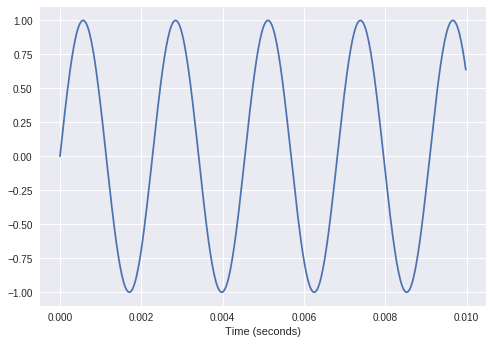

In [4]:
# Creating the same wave again. Repeating just to be able to play with graph.
T = 0.01    # seconds
fs = 44100   # sampling frequency
t = np.linspace(0, T, int(T*fs), endpoint=False) # time variable
x = np.sin(2*np.pi*440*t)

# Plot a sine wave
plt.plot(t, x)
plt.xlabel('Time (seconds)')

We can read a audio file as a array of float numbers.

In [5]:
x, fs = librosa.load('audios/simpleLoop.wav')
print(x.shape)
print(fs)
x

(66150,)
22050


array([-0.0065598 , -0.00321809,  0.00380026, ...,  0.        ,
        0.        ,  0.        ], dtype=float32)

__x is a numpy array, fs is the  sampling frequency of this file__

#### What is sampling frequency?
__Definition 1:__
The sampling frequency (or sample rate) is the number of samples per second in a Sound. For example: if the sampling frequency is 44100 hertz, a recording with a duration of 60 seconds will contain 2,646,000 samples.

Usual values for the sampling frequency are 44100 Hz (CD quality) and 22050 Hz (just enough for speech, since speech does not contain relevant frequencies above 11025 Hz).

- [source](http://www.fon.hum.uva.nl/praat/manual/sampling_frequency.html)

__Definition 2:__
Digital computers can only capture this data at discrete moments in time. The rate at which a computer captures audio data is called the sampling frequency (often abbreviated fs) or sampling rate (often abbreviated sr) 



In [6]:
print("X:", x)
print("size of X:", x.shape)

X: [-0.0065598  -0.00321809  0.00380026 ...,  0.          0.          0.        ]
size of X: (66150,)


__We can also plot this wave to better undestandand it__

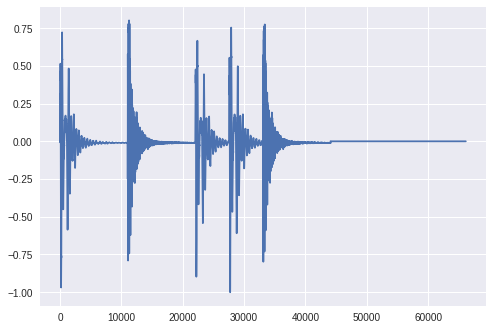

In [7]:
plt.plot(x)

__Listening to it once more:__


In [8]:
Audio('audios/simpleLoop.wav')   

### 1.2. __score__ / __sheet__ music:
The printed, visual form of a musical work is called a __score__ or __sheet__ music

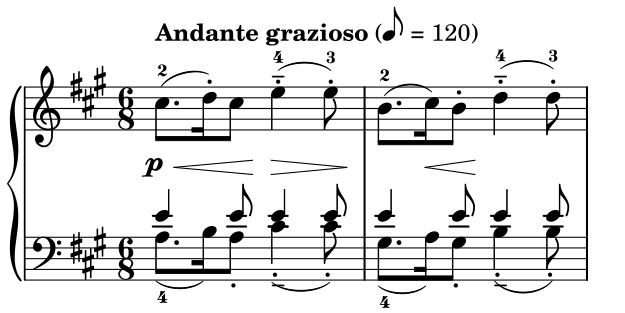

In [9]:
ipd.SVG("https://upload.wikimedia.org/wikipedia/commons/2/27/MozartExcerptK331.svg")

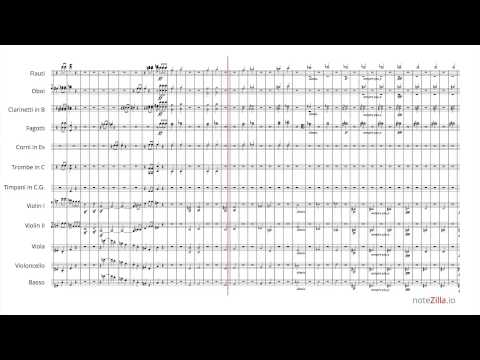

In [10]:
ipd.YouTubeVideo('NWEVKyEwi4A', start=5)

### 1.3. MusicXML
__MusicXML__: it is a way to represent scores/sheet music that a computer can read:

    <?xml version="1.0" encoding="UTF-8" standalone="no"?>
    <!DOCTYPE score-partwise PUBLIC
        "-//Recordare//DTD MusicXML 3.0 Partwise//EN"
        "http://www.musicxml.org/dtds/partwise.dtd">
    <score-partwise version="3.0">
      <part-list>
        <score-part id="P1">
          <part-name>Music</part-name>
        </score-part>
      </part-list>
      <part id="P1">
        <measure number="1">
          <attributes>
            <divisions>1</divisions>
            <key>
              <fifths>0</fifths>
            </key>
            <time>
              <beats>4</beats>
              <beat-type>4</beat-type>
            </time>
            <clef>
              <sign>G</sign>
              <line>2</line>
            </clef>
          </attributes>
          <note>
            <pitch>
              <step>C</step>
              <octave>4</octave>
            </pitch>
            <duration>4</duration>
            <type>whole</type>
          </note>
        </measure>
      </part>
    </score-partwise>


### 1.4. MIDI:

MIDI (Musical Instrument Digital Interface) encodes information for each note event such as the note onset, note offset, and intensity.

The MIDI note number is an integer between 0 and 127 that encodes the note's pitch. Most importantly, C4 (middle C) has MIDI note number 60, and A4 (concert A440) has MIDI note number 69. MIDI note numbers separated by 12 are separated by one octave, e.g. 72 = C5, 84 = C6, etc.


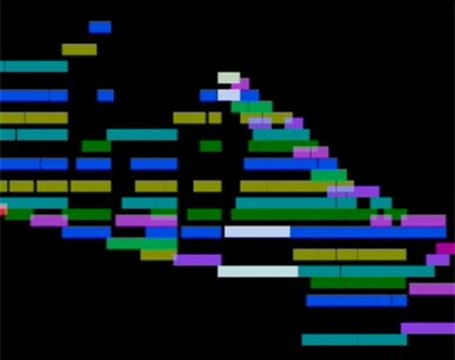

In [11]:
ipd.YouTubeVideo("LlvUepMa31o")

## 2. Feature Extraction

We have seen two general ways to represent text (bag-of-words, n-grams).
This techniques will allow you to represent a textual document into a vector, after a number of pre-processing steps are taken (lower case, remove or not stopwords, stemming, tf-idf).




## 2.1 Zero Crossing Rate

The zero crossing rate only indicates the number of times that a signal crosses the horizontal axis.

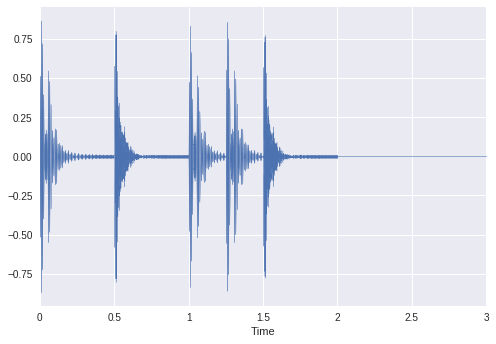

In [12]:
x, fs = librosa.load('audios/simpleLoop.wav')
librosa.display.waveplot(x, sr=fs)

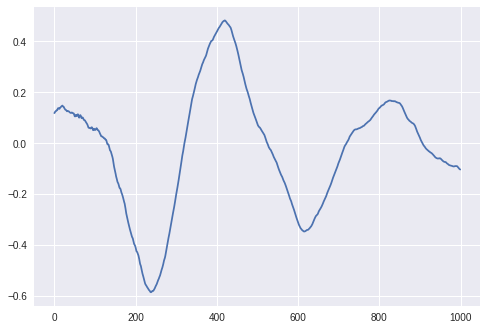

In [13]:
plt.plot(x[1000:2000])

In [14]:
zcrs = librosa.zero_crossings(x[1000:2000], pad=False)
print("First 100 elements:", zcrs[:100])
print("Shape:", zcrs.shape)
print("Number of zero crossing rates:", sum(zcrs))

First 100 elements: [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False]
Shape: (1000,)
Number of zero crossing rates: 5


__Important to note that we need to segment a signal to use it__

Signal segmentation is based on top of 2 parameters:
1. the number of segments (known as frame size)
2. the size of each segment (known as hop size)

Segmenting is equivalent to the following python code:


In [15]:
frame_sz = 1024
hop_sz = 512

for i in range(0, len(x), hop_sz):
    # Do something with each segment
    x[i:i+frame_sz]
    

To better, understand let's see how zero_crossing_rate is calculated in a very small segment:

Vector: [ 0.01048312  0.00462377 -0.00132055 -0.00469463]


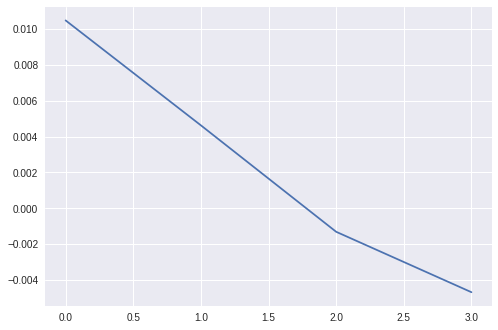

In [16]:
zc = x[1128:1132]
plt.plot(zc)
print("Vector:", zc)

In [17]:
# cz has only 4 positions as shwon above. We will create frames of lenght 2.
# zero_crossing_rate calculates the number of crossings over time
zcrs = librosa.feature.zero_crossing_rate(zc, frame_length=2, hop_length=1, center=False)
print(zcrs.shape)
zcrs[0]

(1, 3)


array([ 0. ,  0.5,  0. ])

Now we can calculate the Zero-Crossing rate for the whole piece of song.
Using default parameters (frame_length=2048, hop_length=512)

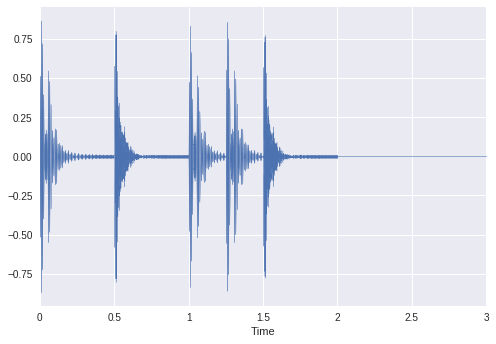

In [18]:
x, fs = librosa.load('audios/simpleLoop.wav')
librosa.display.waveplot(x, sr=fs)

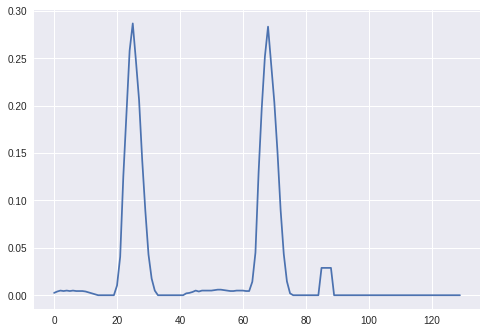

In [19]:
zcrs = librosa.feature.zero_crossing_rate(x)
plt.plot(zcrs[0])

# Can you tell me why the horizontal axis of this graph goes only up to ~130

## 2.2 - Fourier Transform

- [Fourier Transform Tutorial](http://www.thefouriertransform.com/)
Idea: __All waveforms__, no matter what you scribble or observe in the universe, are actually just the __sum of simple sinusoids of different frequencies__.


Orginal wave:


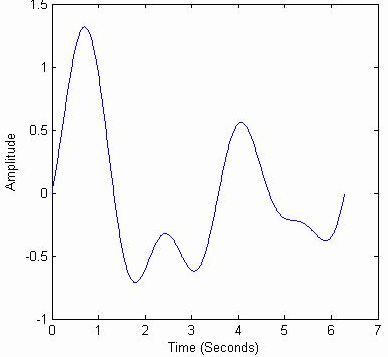

Fundamental wave 1:


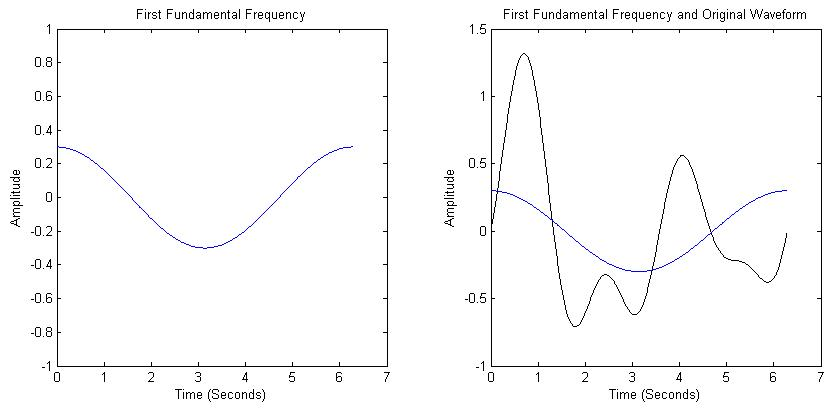

Fundamental wave 2:


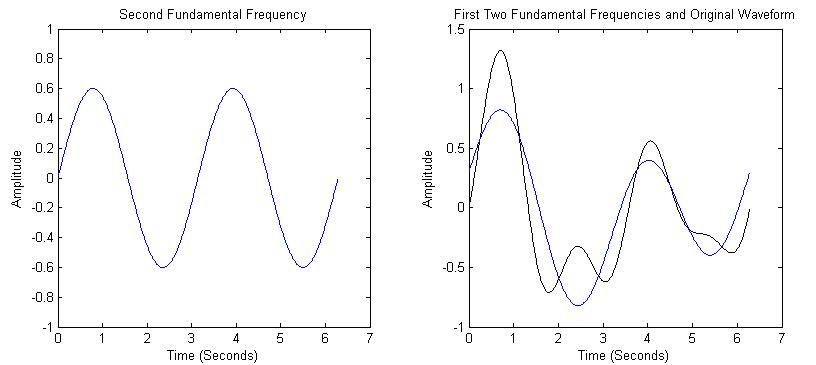

In [20]:
print("Orginal wave:")
display(Image("images/func_orig.png"))
print("Fundamental wave 1:")
display(Image("images/waveS1.jpg"))
print("Fundamental wave 2:")
display(Image("images/waveS2.jpg"))

Fundamental wave 3:


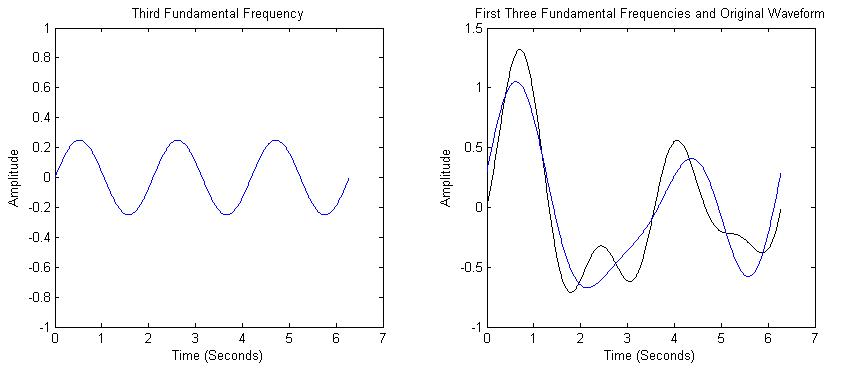

Fundamental wave 4:


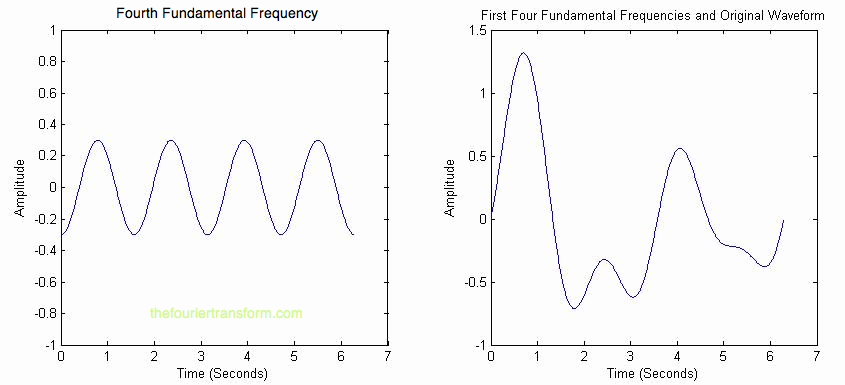

In [21]:
print("Fundamental wave 3:")
display(Image("images/waveS3.jpg"))
print("Fundamental wave 4:")
display(Image("images/waveS4.jpg"))

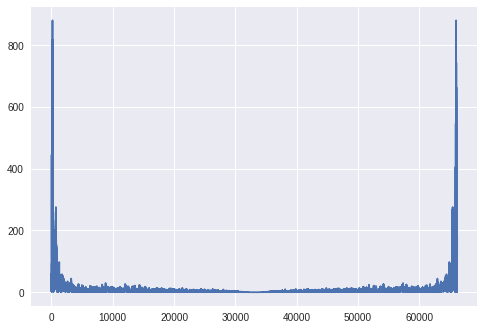

In [22]:
# Simply calculate the f
x, fs = librosa.load('audios/simpleLoop.wav')

X = sp.fft(x)
X_mag = np.absolute(X)
plt.plot(X_mag) # magnitude spectrum


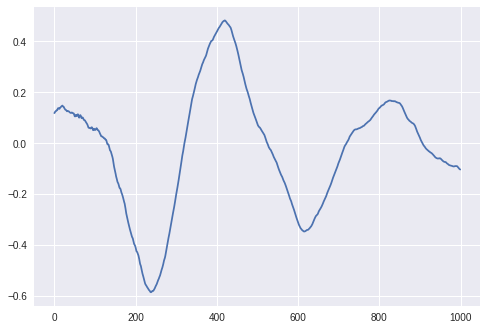

In [23]:
plt.plot(x[1000:2000])

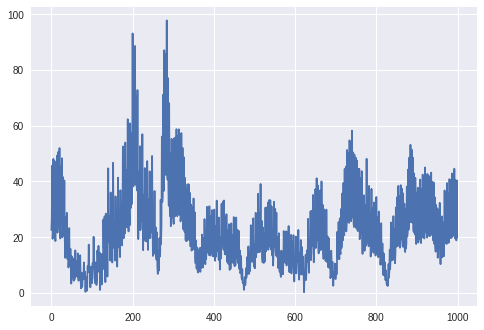

In [24]:
plt.plot(X_mag[1000:2000])

### 2.3 Spectrum

/home/palotti/venv3/lib64/python3.5/site-packages/matplotlib/axes/_axes.py:7222: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


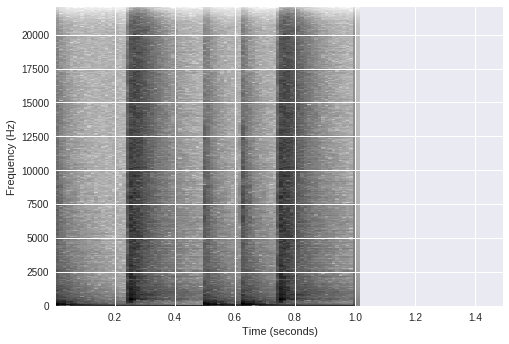

In [25]:
S, freqs, bins, im = plt.specgram(x, NFFT=1024, noverlap=512, Fs=44100)
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')

### 2.4 Mel Scale

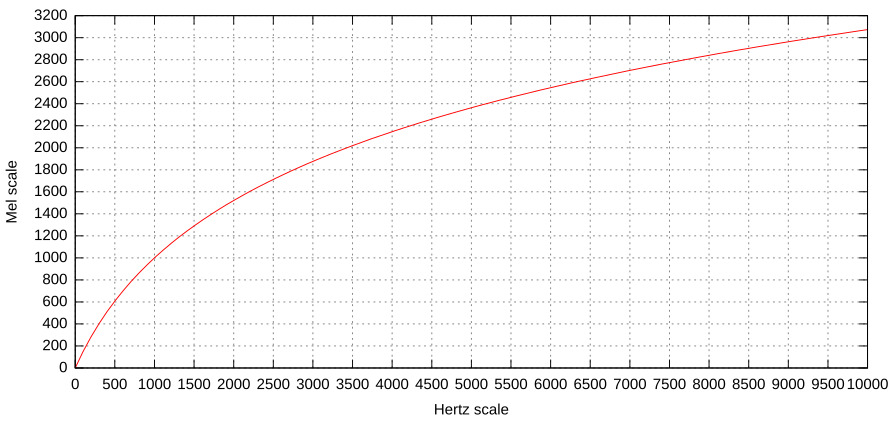

Mel scale transformation


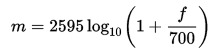

In [26]:
display(Image("/home/palotti/Dropbox/cmuclasses/images/melscale.jpg"))
print("Mel scale transformation")
display(Image("/home/palotti/Dropbox/cmuclasses/images/formula.jpg"))

In [27]:
# Quite similar to our last generated function, but now we are increasing the frequency over time
T = 5.0      # duration in seconds
fs = 44100.0 # sampling rate in Hertz
f0 = 440 * np.logspace(-2, 2, T*fs, endpoint=False, base=2.0) # time-varying frequency
t = np.linspace(0, T, T*fs, endpoint=False)
x = 0.01*np.sin(2* np.pi*f0*t)

print("Min freq: %.3f, Max freq: %.3f" % (f0.min(), f0.max()))

# load a NumPy array
Audio(x, rate=fs)

Min freq: 110.000, Max freq: 1759.978


/home/palotti/venv3/lib64/python3.5/site-packages/ipykernel/__main__.py:5: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.


In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency.

MFCCs are commonly derived as follows:[1][2]

1. Take the Fourier transform of (a windowed excerpt of) a signal.
2. Map the powers of the spectrum obtained above onto the mel scale, using triangular overlapping windows.
3. Take the logs of the powers at each of the mel frequencies.
4. Take the discrete cosine transform of the list of mel log powers, as if it were a signal.
5. The MFCCs are the amplitudes of the resulting spectrum.


__References:__
- [Wikipedia - Mel Frequency cepstrum coefficents](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum)
- [Wikipedia - Mel Scale](https://en.wikipedia.org/wiki/Mel_scale)

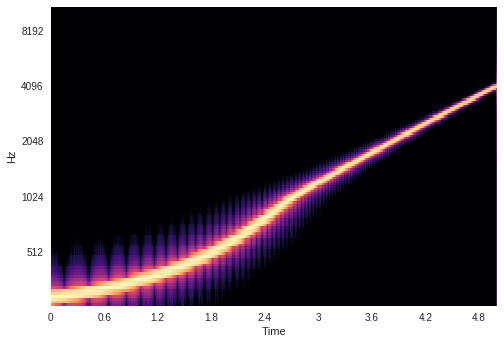

In [28]:
S = librosa.feature.melspectrogram(x, sr=fs, n_fft=1024)
logS = librosa.logamplitude(S)
librosa.display.specshow(logS, sr=fs, x_axis='time', y_axis='mel')

# Try different sound waves to see what you get

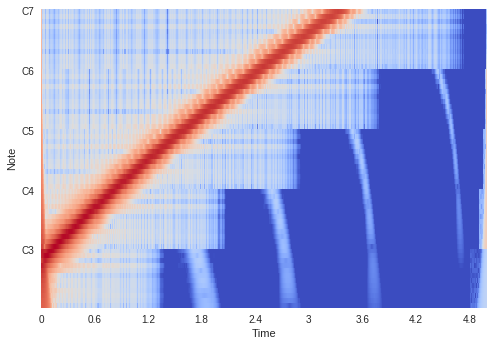

In [29]:
fmin = librosa.midi_to_hz(36)
C = librosa.cqt(x, sr=fs, fmin=fmin, n_bins=60)
logC = librosa.logamplitude(C)
librosa.display.specshow(logC, sr=fs, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')

### 2.5 Spectral Moments

Spectral moments (centroid, bandwidth, skewness, kurtosis) and other spectral statistics.

You are probably already familiar with two examples of moments: mean and variance. The first raw moment is known as the mean. The second central moment is known as the variance.


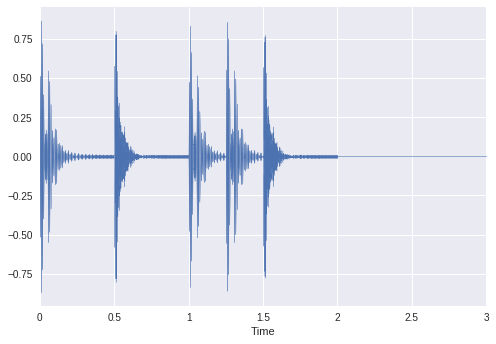

In [30]:
x, fs = librosa.load('audios/simpleLoop.wav')
librosa.display.waveplot(x, sr=fs)
Audio('audios/simpleLoop.wav')

In [31]:
# Code to plot a moments metric and its spectrogram
def plot_log_power_spectrogram(values, label):
    plt.subplot(2, 1, 1)
    plt.semilogy(values.T, label=label)
    plt.ylabel('Hz')
    plt.xticks([])
    plt.xlim([0, values.shape[-1]])
    plt.legend()
    plt.subplot(2, 1, 2)
    librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), y_axis='log', x_axis='time')
    plt.title('log Power ' + label)
    plt.tight_layout()
    
#See example at: https://librosa.github.io/librosa/generated/librosa.feature.spectral_bandwidth.html

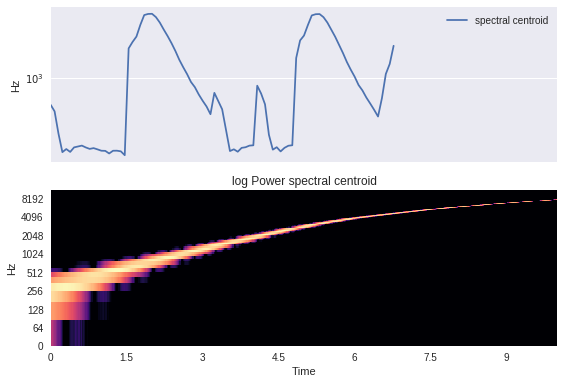

In [32]:
# Centroids:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=fs)
plot_log_power_spectrogram(spectral_centroids, "spectral centroid")

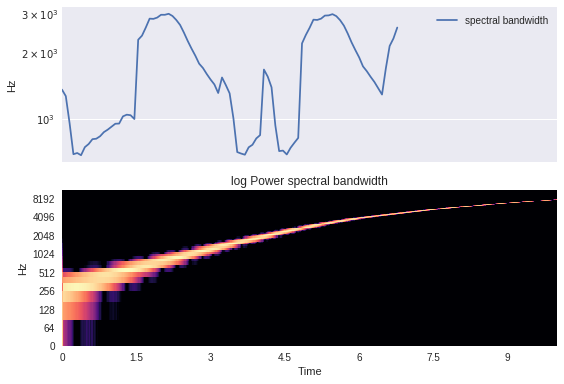

In [33]:
spec_bw = librosa.feature.spectral_bandwidth(x, sr=fs)
plot_log_power_spectrogram(spec_bw, "spectral bandwidth")

### 2.6 Chromagram

Chromagram from a waveform or power spectrogram.


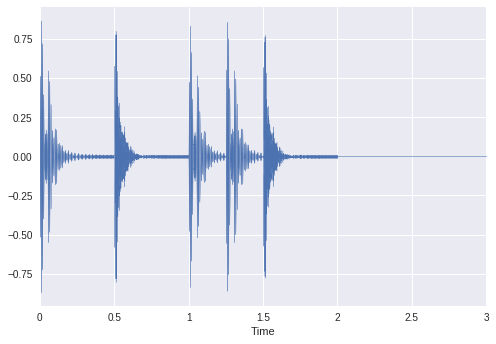

In [34]:
x, fs = librosa.load('audios/simpleLoop.wav')
librosa.display.waveplot(x, sr=fs)
Audio('audios/simpleLoop.wav')

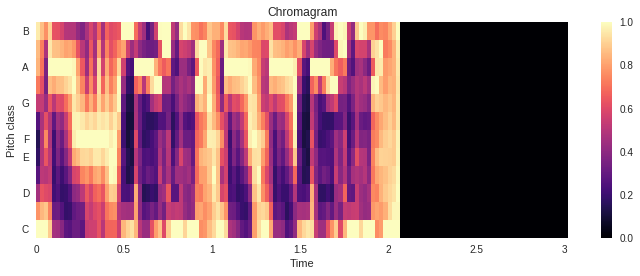

In [35]:
chroma = librosa.feature.chroma_stft(x, sr=fs)

plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

__There are many other features that one can extract. 
They are highly dependent on the task that you are performing.
See [here](https://librosa.github.io/librosa/feature.html) for more feature examples.__

## 3 - Audio Classification

In the next toy example, we will classify drum beats into kicks and snares

__Load training set__

In [36]:
kick_filepaths = [("training_audio/Bass_Drum_%02d_V01.WAV" % i) for i in range(1, 11)]
snare_filepaths = [('training_audio/SNARE_%02d_01.WAV' % i) for i in range(1, 11)]

Kick:


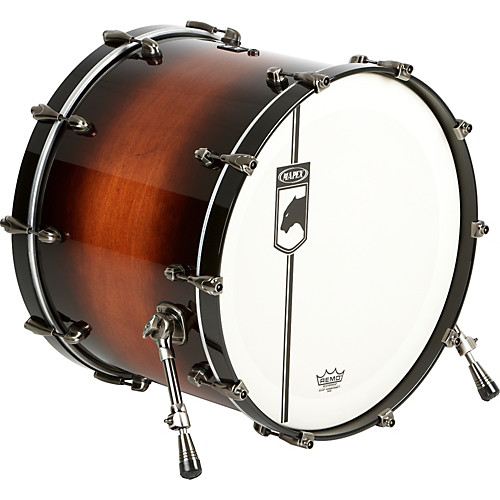

training_audio/Bass_Drum_01_V01.WAV


training_audio/Bass_Drum_02_V01.WAV


training_audio/Bass_Drum_03_V01.WAV


training_audio/Bass_Drum_04_V01.WAV


training_audio/Bass_Drum_05_V01.WAV


training_audio/Bass_Drum_06_V01.WAV


training_audio/Bass_Drum_07_V01.WAV


training_audio/Bass_Drum_08_V01.WAV


training_audio/Bass_Drum_09_V01.WAV


training_audio/Bass_Drum_10_V01.WAV


In [37]:
print("Kick:")
display(Image("images/kick.jpg", width="200"))

for filename in kick_filepaths:
    print(filename),
    display(Audio(filename))

Snare:


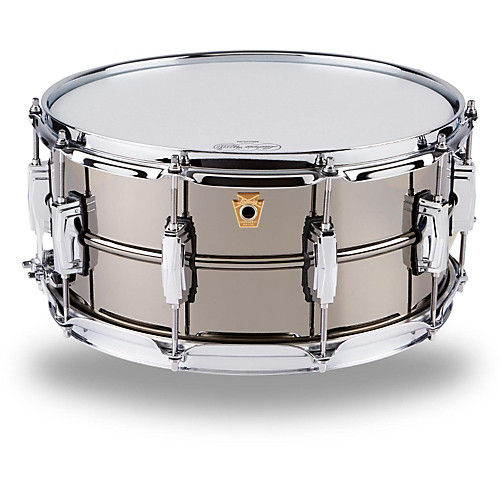

training_audio/SNARE_01_01.WAV


training_audio/SNARE_02_01.WAV


training_audio/SNARE_03_01.WAV


training_audio/SNARE_04_01.WAV


training_audio/SNARE_05_01.WAV


training_audio/SNARE_06_01.WAV


training_audio/SNARE_07_01.WAV


training_audio/SNARE_08_01.WAV


training_audio/SNARE_09_01.WAV


training_audio/SNARE_10_01.WAV


In [38]:
print("Snare:")
display(Image("images/snare.jpg", width="200"))

for filename in snare_filepaths:
    print(filename), 
    display(Audio(filename))

Read and store each signal

In [39]:
kick_signals = [
    librosa.load(p)[0] for p in kick_filepaths
]
snare_signals = [
    librosa.load(p)[0] for p in snare_filepaths
]

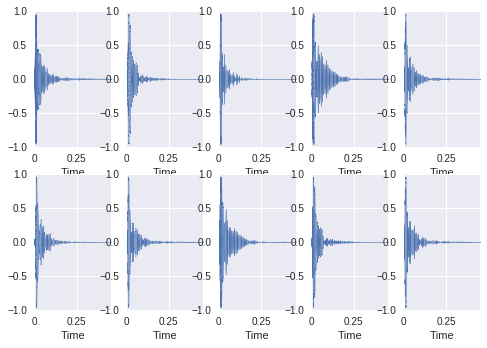

In [40]:
# Check the wave of snare signals
for i, x in enumerate(kick_signals):
    plt.subplot(2, 5, i+1)
    librosa.display.waveplot(x[:10000])
    plt.ylim(-1, 1)

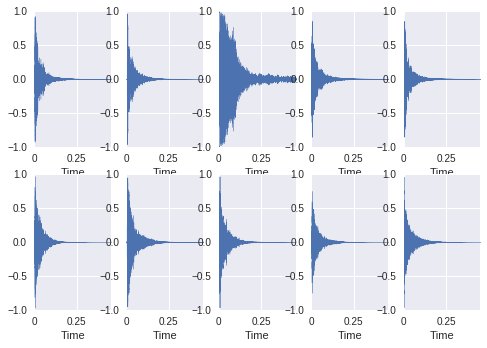

In [41]:
# Check the wave of snare signals
for i, x in enumerate(snare_signals):
    plt.subplot(2, 5, i+1)
    librosa.display.waveplot(x[:10000])
    plt.ylim(-1, 1)

In [42]:
# Let's extract simple features here.
# Just the first zero crossing rant and the first spectral centroid value
def extract_features(signal):
    return [
        librosa.feature.zero_crossing_rate(signal)[0, 0],
        librosa.feature.spectral_centroid(signal)[0, 0],
    ]

In [43]:
kick_features = np.array([extract_features(x) for x in kick_signals])
snare_features = np.array([extract_features(x) for x in snare_signals])

In [44]:
training_features = np.concatenate((kick_features,snare_features))
training_labels = np.array([1] * len(kick_features) + [0] * len(snare_features))

In [45]:
print(training_labels)

[1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0]


In [46]:
print(training_features)

[[  2.73437500e-02   1.91916389e+03]
 [  1.51367188e-02   9.83770662e+02]
 [  1.31835938e-02   5.91250571e+02]
 [  1.12304688e-02   2.00287156e+03]
 [  1.90429688e-02   1.06163066e+03]
 [  1.26953125e-02   9.11405220e+02]
 [  2.19726562e-02   9.78849435e+02]
 [  2.24609375e-02   1.54587434e+03]
 [  1.75781250e-02   1.24313096e+03]
 [  2.24609375e-02   1.08402167e+03]
 [  6.83593750e-02   2.60948093e+03]
 [  7.17773438e-02   2.24174137e+03]
 [  8.54492188e-02   2.71090360e+03]
 [  8.30078125e-02   2.71745783e+03]
 [  8.00781250e-02   2.58347815e+03]
 [  8.05664062e-02   2.68342476e+03]
 [  5.71289062e-02   2.56993431e+03]
 [  8.34960938e-02   2.49985216e+03]
 [  6.34765625e-02   2.06677877e+03]
 [  8.10546875e-02   2.59628944e+03]]


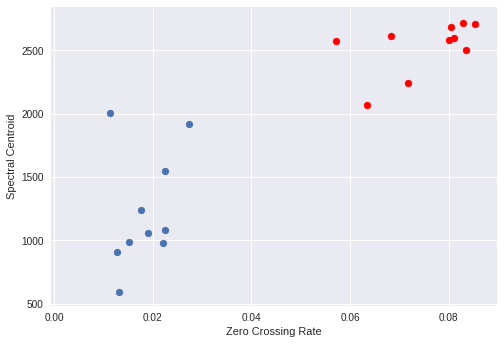

In [47]:
plt.scatter(training_features[:10,0], training_features[:10,1])
plt.scatter(training_features[10:,0], training_features[10:,1], color='r')
plt.xlabel('Zero Crossing Rate')
plt.ylabel('Spectral Centroid')

__Load test set__

In [48]:
kick_test_filepaths = [("test_audio/kick%d.wav" % i) for i in range(1, 6)]
snare_test_filepaths = [('test_audio/snare%d.wav' % i) for i in range(1, 6)]
kick_test_signals = [
    librosa.load(p)[0] for p in kick_test_filepaths
]
snare_test_signals = [
    librosa.load(p)[0] for p in snare_test_filepaths
]
kick_test_features = np.array([extract_features(x) for x in kick_test_signals])
snare_test_features = np.array([extract_features(x) for x in snare_test_signals])
test_features = np.concatenate((kick_test_features,snare_test_features))
test_labels = np.array([1] * len(kick_test_features) + [0] * len(snare_test_features))

In [49]:
print(test_labels, test_features)

[1 1 1 1 1 0 0 0 0 0] [[  1.02539062e-02   2.30315847e+03]
 [  2.44140625e-02   2.63885766e+03]
 [  6.34765625e-03   7.02084471e+02]
 [  3.56445312e-02   1.91633526e+03]
 [  3.61328125e-02   1.94593599e+03]
 [  9.17968750e-02   2.99024516e+03]
 [  1.12792969e-01   3.01286730e+03]
 [  9.27734375e-02   2.60259548e+03]
 [  1.11816406e-01   3.19490449e+03]
 [  5.71289062e-02   2.67228209e+03]]


In [50]:
import sklearn
model = sklearn.neighbors.KNeighborsClassifier(n_neighbors=1, algorithm="brute")
model.fit(training_features,training_labels)

KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=1, p=2,
           weights='uniform')

In [51]:
prediction = model.predict(test_features)
prediction

array([0, 0, 1, 1, 1, 0, 0, 0, 0, 0])

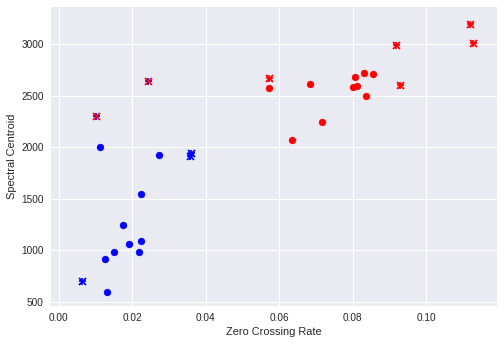

In [52]:
# Training Examples:
plt.scatter(training_features[:10,0], training_features[:10,1], color='b' )
plt.scatter(training_features[10:,0], training_features[10:,1], color='r')

# Test example, true labels
plt.scatter(test_features[test_labels==1,0], test_features[test_labels==1,1], color='b', marker='+')
plt.scatter(test_features[test_labels==0,0], test_features[test_labels==0,1], color='r', marker='+')

# Prediction Results
plt.scatter(test_features[prediction==1,0], test_features[prediction==1,1], color='b', marker='x')
plt.scatter(test_features[prediction==0,0], test_features[prediction==0,1], color='r', marker='x')

plt.xlabel('Zero Crossing Rate')
plt.ylabel('Spectral Centroid')

__Can anyone explain why our KNN did the mistakes above???__

_..._

_..._

_..._

_..._

_..._

So, we can fix this problem scaling the features. A simple and efficient technique is known as 0-1 scaling, which consists in mapping all the numbers for a given feature to a scale in which the minimal value is 0 and the maximum is 1.

In [53]:
scale = sklearn.preprocessing.MinMaxScaler()
training_features = scale.fit_transform(training_features)
test_features = scale.transform(test_features)

model = sklearn.neighbors.KNeighborsClassifier(n_neighbors=1, algorithm="brute")
model.fit(training_features,training_labels)
prediction = model.predict(test_features)
prediction

array([1, 1, 1, 1, 1, 0, 0, 0, 0, 0])

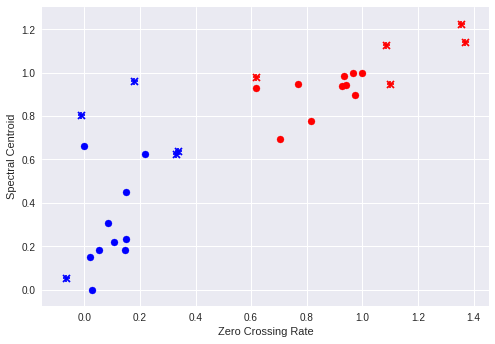

In [54]:
# Training Examples:
plt.scatter(training_features[:10,0], training_features[:10,1], color='b' )
plt.scatter(training_features[10:,0], training_features[10:,1], color='r')

# Test example, true labels
plt.scatter(test_features[test_labels==1,0], test_features[test_labels==1,1], color='b', marker='+')
plt.scatter(test_features[test_labels==0,0], test_features[test_labels==0,1], color='r', marker='+')

# Prediction Results
plt.scatter(test_features[prediction==1,0], test_features[prediction==1,1], color='b', marker='x')
plt.scatter(test_features[prediction==0,0], test_features[prediction==0,1], color='r', marker='x')

plt.xlabel('Zero Crossing Rate')
plt.ylabel('Spectral Centroid')

## 4 - Audio Clustering

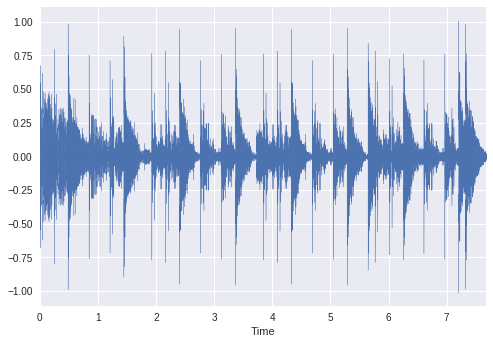

In [55]:
x, fs = librosa.load('audios/drum.wav')
librosa.display.waveplot(x, sr=fs)
Audio('audios/drum.wav')

__Task is to group same types of beats__

In [56]:
onset_frames = librosa.onset.onset_detect(x, sr=fs, delta=0.04, wait=4)
onset_times = librosa.frames_to_time(onset_frames, sr=fs)
onset_samples = librosa.frames_to_samples(onset_frames)

In [57]:
onset_samples

array([  6144,  11264,  18944,  22016,  27136,  32256,  37888,  40448,
        43008,  48128,  53248,  58880,  61440,  64000,  69120,  74752,
        80384,  82944,  85504,  90624,  95744, 101376, 103936, 106496,
       111616, 116736, 122368, 124928, 133120, 138240, 145920, 148992,
       154112, 157184, 159744, 162304])

In [58]:
x_with_beeps = mir_eval.sonify.clicks(onset_times, fs, length=len(x))
Audio(x + x_with_beeps, rate=fs)

We have learned how to extract features, so let's do that once again...

In [59]:
onset_samples

array([  6144,  11264,  18944,  22016,  27136,  32256,  37888,  40448,
        43008,  48128,  53248,  58880,  61440,  64000,  69120,  74752,
        80384,  82944,  85504,  90624,  95744, 101376, 103936, 106496,
       111616, 116736, 122368, 124928, 133120, 138240, 145920, 148992,
       154112, 157184, 159744, 162304])

In [60]:
def extract_features(x, fs):
    zcr = librosa.zero_crossings(x).sum()
    energy = sp.linalg.norm(x)
    return [zcr, energy]

frame_sz = fs*0.090
features = np.array([extract_features(x[i:int(i+frame_sz)], fs) for i in onset_samples])
print(features.shape)

(36, 2)


In [61]:
# Scale features: this time from -1 to 1
min_max_scaler = sklearn.preprocessing.MinMaxScaler(feature_range=(-1, 1))
features_scaled = min_max_scaler.fit_transform(features)
print(features_scaled.shape)
print(features_scaled.min(axis=0))
print(features_scaled.max(axis=0))

(36, 2)
[-1. -1.]
[ 1.  1.]


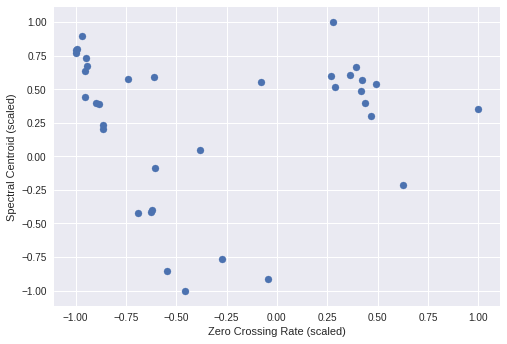

In [62]:
# Plot beats
plt.scatter(features_scaled[:,0], features_scaled[:,1])
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Spectral Centroid (scaled)')

In [63]:
# Let's cluster using KMeans (explain in class what does it mean)
model = sklearn.cluster.KMeans(n_clusters=2)
labels = model.fit_predict(features_scaled)
print(labels)

[0 0 1 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 0 0]


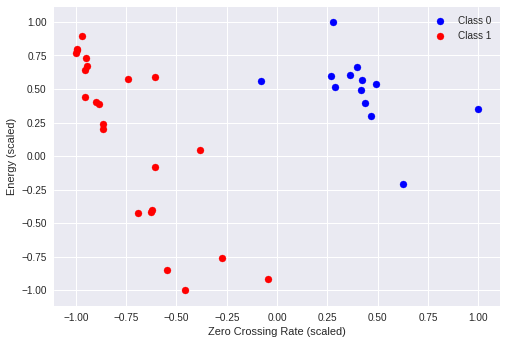

In [64]:
# Visualize/hear clusters
plt.scatter(features_scaled[labels==0,0], features_scaled[labels==0,1], c='b')
plt.scatter(features_scaled[labels==1,0], features_scaled[labels==1,1], c='r')
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Energy (scaled)')
plt.legend(('Class 0', 'Class 1'))

In [65]:
x_0 = mir_eval.sonify.clicks(onset_times[labels==0], fs, length=len(x))
x_1 = mir_eval.sonify.clicks(onset_times[labels==1], fs, length=len(x))

display(Audio(x + x_0, rate=fs))
display(Audio(x + x_1, rate=fs))

In [66]:
model = sklearn.cluster.AffinityPropagation()
labels = model.fit_predict(features_scaled)
print(labels)

[0 0 2 1 2 0 1 0 2 2 0 1 2 1 2 0 1 0 2 2 0 1 2 1 2 0 1 0 2 0 2 1 2 2 0 0]


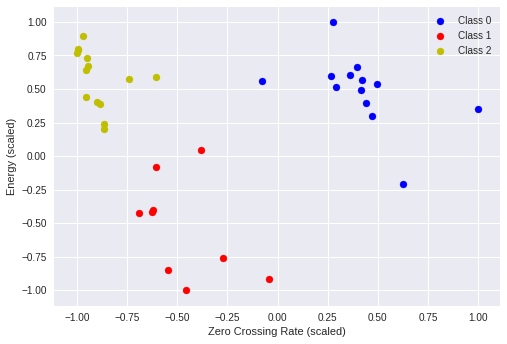

In [67]:
plt.scatter(features_scaled[labels==0,0], features_scaled[labels==0,1], c='b')
plt.scatter(features_scaled[labels==1,0], features_scaled[labels==1,1], c='r')
plt.scatter(features_scaled[labels==2,0], features_scaled[labels==2,1], c='y')
plt.xlabel('Zero Crossing Rate (scaled)')
plt.ylabel('Energy (scaled)')
plt.legend(('Class 0', 'Class 1', 'Class 2'))

In [68]:
x_0 = mir_eval.sonify.clicks(onset_times[labels==0], fs, length=len(x))
x_1 = mir_eval.sonify.clicks(onset_times[labels==1], fs, length=len(x))
x_2 = mir_eval.sonify.clicks(onset_times[labels==2], fs, length=len(x))

display(Audio(x + x_0, rate=fs))
display(Audio(x + x_1, rate=fs))
display(Audio(x + x_2, rate=fs))

## 5 - Audio Retrieval

In [69]:
def bool2int(x):
    y = 0
    for i,j in enumerate(x):
        if j: y += 1<<i
    return y

In [70]:
def hash_func(vecs, projections):
    bools = np.dot(vecs, projections.T) > 0
    return [bool2int(bool_vec) for bool_vec in bools]

In [71]:
X = np.random.randn(20,100)
P = np.random.randn(4,100)
#X = randn(10,100)
#P = randn(3,100)
print("X:", X)
print("P:", P)
hash_func(X, P)

X: [[  2.23671191e-01   1.01761153e+00  -8.00888098e-01 ...,  -8.11249925e-01
    4.95258302e-01  -2.94380293e-01]
 [  1.43521127e+00   1.06062662e+00   1.22445795e+00 ...,  -9.13692934e-04
   -1.68457619e+00   3.71510225e-01]
 [  1.32233520e+00   3.01995140e-01  -1.05573850e+00 ...,   1.21873267e+00
    1.50437206e+00  -3.82351178e-01]
 ..., 
 [  5.33911973e-01  -8.12530023e-01  -3.82472993e-01 ...,   2.60000848e-01
   -6.80097003e-01   7.91335646e-01]
 [ -1.03550306e+00  -1.26051711e+00  -1.72155753e-02 ...,   8.12695250e-01
    9.43094889e-01   3.73376541e-01]
 [ -6.25115762e-01  -1.45528805e+00  -8.78237343e-01 ...,  -5.77413917e-02
   -1.44018344e-01   5.88276731e-01]]
P: [[ 0.10473912 -0.03828042  0.99645595  1.4050994   1.67058225  2.39798494
   0.98134561  0.40123961 -0.56078979  2.47634537  0.08064938 -0.55824997
  -0.06905783  0.56270972 -0.82118481  0.6804868  -0.50902776 -2.6675004
   0.82335492 -1.16392361 -0.11443373 -0.79333585  1.14259087  0.55020632
  -0.01950235 -1.35

[14, 9, 4, 14, 9, 14, 4, 4, 13, 10, 12, 4, 8, 2, 9, 2, 6, 4, 8, 1]

In [72]:
np.dot(X,P.T)

array([[ -3.78259033e+00,   1.75206583e+01,   1.31983862e+00,
          9.80973600e+00],
       [  6.44184185e-01,  -1.47784847e+01,  -3.86386281e-03,
          1.92641275e+00],
       [ -1.23899963e+01,  -6.22591272e+00,   1.54842038e+01,
         -6.72262027e+00],
       [ -3.53549714e-01,   7.60249233e+00,   2.51606575e+00,
          1.00830614e+01],
       [  2.12503090e+01,  -1.20517710e+01,  -6.05309278e+00,
          1.58475551e+01],
       [ -3.29047058e+00,   8.18360219e+00,   3.78678168e+00,
          1.65745887e+00],
       [ -3.37294777e+00,  -4.06387941e+00,   8.63585689e+00,
         -1.38274956e+01],
       [ -1.28304666e+00,  -1.01446015e+01,   4.98921046e+00,
         -1.44589581e+01],
       [  1.87771622e+01,  -1.73996970e+01,   2.04913904e+01,
          1.12843689e+01],
       [ -5.41345353e+00,   1.32273166e+01,  -9.80511328e+00,
          1.45607459e+01],
       [ -3.08043052e+00,  -7.54516430e+00,   9.70889951e+00,
          3.96306579e+00],
       [ -4.70530089e

In [73]:
class Table:
    
    def __init__(self, hash_size, dim):
        self.table = dict()
        self.hash_size = hash_size
        self.projections = np.random.randn(self.hash_size, dim)

    def add(self, vecs, label):
        entry = {'label': label}
        hashes = hash_func(vecs, self.projections)
        for h in hashes:
            if h in self.table:
                self.table[h].append(entry)
            else:
                self.table[h] = [entry]

    def query(self, vecs):
        hashes = hash_func(vecs, self.projections)
        results = list()
        for h in hashes:
            if h in self.table:
                results.extend(self.table[h])
        return results

In [74]:
class LSH:
    
    def __init__(self, dim):
        self.num_tables = 4
        self.hash_size = 8
        self.tables = list()
        for i in range(self.num_tables):
            self.tables.append(Table(self.hash_size, dim))
    
    def add(self, vecs, label):
        for table in self.tables:
            table.add(vecs, label)
    
    def query(self, vecs):
        results = list()
        for table in self.tables:
            results.extend(table.query(vecs))
        return results

    def describe(self):
        for table in self.tables:
            print(table.table)

In [75]:
class MusicSearch:
    
    def __init__(self, training_files):
        self.frame_size = 4096
        self.hop_size = 4000
        self.fv_size = 12
        self.lsh = LSH(self.fv_size)
        self.training_files = training_files
        self.num_features_in_file = dict()
        for f in self.training_files:
            self.num_features_in_file[f] = 0
                
    def train(self):
        for filepath in self.training_files:
            print ("Processing ...%s" % (filepath))
            x, fs = librosa.load(filepath)
            features = librosa.feature.chroma_stft(x, fs, n_fft=self.frame_size, hop_length=self.hop_size).T
            self.lsh.add(features, filepath)
            self.num_features_in_file[filepath] += len(features)
                
    def query(self, filepath):
        x, fs = librosa.load(filepath)
        features = librosa.feature.chroma_stft(x, fs, n_fft=self.frame_size, hop_length=self.hop_size).T
        results = self.lsh.query(features)
        
        counts = dict()
        for r in results:
            if r['label'] in counts:
                counts[r['label']] += 1
            else:
                counts[r['label']] = 1
        for k in counts:
            counts[k] = float(counts[k])/self.num_features_in_file[k]
        return counts

In [76]:
import os
training_dir = '/home/palotti/notallwaves'
training_files = [os.path.join(training_dir, f) for f in os.listdir(training_dir)]
print("Processing %d files." % (len(training_files)))

Processing 31 files.


In [77]:
x, fs = librosa.load(training_files[6])
frame_size = 4096
hop_size = 4000

features = librosa.feature.chroma_stft(x, fs, n_fft=frame_size, hop_length=hop_size).T
projections = np.random.randn(8, 12)

hashes = hash_func(features, projections)

hashes, len(hashes), min(hashes), max(hashes)

([28,
  28,
  28,
  28,
  28,
  28,
  28,
  28,
  253,
  93,
  28,
  28,
  28,
  28,
  29,
  175,
  239,
  191,
  191,
  191,
  191,
  191,
  191,
  175,
  175,
  191,
  191,
  191,
  191,
  191],
 30,
 28,
 253)

In [78]:
# Training phase
ms = MusicSearch(training_files)
ms.train()

Processing .../home/palotti/notallwaves/70s Electric Piano 05.wav
Processing .../home/palotti/notallwaves/70s Rock Piano 06.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 09.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 04.wav
Processing .../home/palotti/notallwaves/70s Rock Piano 10.wav
Processing .../home/palotti/notallwaves/70s Rock Piano 03.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 03.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 02.wav
Processing .../home/palotti/notallwaves/12 String Dream 09.wav
Processing .../home/palotti/notallwaves/12 String Dream 05.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 01.wav
Processing .../home/palotti/notallwaves/70s Electric Piano 08.wav
Processing .../home/palotti/notallwaves/12 String Dream 07.wav
Processing .../home/palotti/notallwaves/70s Rock Piano 05.wav
Processing .../home/palotti/notallwaves/70s Rock Piano 01.wav
Processing .../home/palotti/notallwaves

In [79]:
# Testing phase
results = ms.query('/home/palotti/notallwaves/12 String Dream 01.wav')
for r in sorted(results, key=results.get, reverse=True):
    print(r)

/home/palotti/notallwaves/12 String Dream 01.wav
/home/palotti/notallwaves/12 String Dream 07.wav
/home/palotti/notallwaves/12 String Dream 08.wav
/home/palotti/notallwaves/12 String Dream 02.wav
/home/palotti/notallwaves/70s Rock Piano 06.wav
/home/palotti/notallwaves/70s Rock Piano 08.wav
/home/palotti/notallwaves/12 String Dream 03.wav
/home/palotti/notallwaves/12 String Dream 06.wav
/home/palotti/notallwaves/12 String Dream 09.wav
/home/palotti/notallwaves/70s Rock Piano 02.wav
/home/palotti/notallwaves/70s Rock Piano 04.wav
/home/palotti/notallwaves/70s Rock Piano 10.wav
/home/palotti/notallwaves/70s Rock Piano 09.wav
/home/palotti/notallwaves/70s Rock Piano 07.wav
/home/palotti/notallwaves/12 String Dream 04.wav
/home/palotti/notallwaves/70s Rock Piano 03.wav
/home/palotti/notallwaves/70s Electric Piano 01.wav
/home/palotti/notallwaves/70s Rock Piano 05.wav
/home/palotti/notallwaves/70s Rock Piano 01.wav
/home/palotti/notallwaves/70s Electric Piano 02.wav
/home/palotti/notallwave